In [29]:
import torch
import torch.nn as nn
import torchvision
from torchvision import transforms, datasets
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image, ImageEnhance, ImageOps, ImageFilter
import random
import os

from tqdm import tqdm

In [30]:
class EncoderData(Dataset):
    def __init__(self, image_paths, transform):
        self.image_paths = image_paths
        self.transform = transform

    def __getitem__(self, index):
        x = self.image_paths[index][0]
        y = self.image_paths[index][1]
        x = self.transform(self.pil_loader(x))
        y = self.transform(self.pil_loader(y))
        return x, y

    def __len__(self):
        return len(self.image_paths)
    
    def pil_loader(self, path):
        with open(path, 'rb') as f:
            img = Image.open(f)
            return img.convert('RGB')

In [31]:
image_paths = []
for image in os.listdir('data/clean'):
    x = 'data/clean/' + image
    y = 'data/damaged/' + ' '.join(image.split('.')[:-1]) + '_dmg.png'
    image_paths.append((x, y))

In [32]:
batch_size = 128

trnsfrm = transforms.Compose([transforms.Resize((224, 224), interpolation=1),
                              transforms.ToTensor()]
                            )

datafolder = EncoderData(image_paths, transform=trnsfrm)

# num_workers > 0 breaks the dataloader - many posts on the PyTorch forums about this but none resolve the issue
encoder_data = DataLoader(datafolder,
                          batch_size=batch_size,
                          shuffle=True,
                          num_workers=0, 
                          pin_memory=True)

In [61]:
class CNNAutoEncoder(nn.Module):
    def __init__(self):
        super(CNNAutoEncoder, self).__init__()
        self.encoder = nn.Sequential(nn.Conv2d(3, 16, 3, stride=2, padding=0),
                                     nn.ReLU(),
                                     nn.Conv2d(16, 32, 3, stride=2, padding=0),
                                     nn.ReLU(),
                                     nn.Conv2d(32, 64, 3, stride=1, padding=0),
                                     nn.ReLU(),
                                     nn.BatchNorm2d(64)
                                    )
        self.decoder = nn.Sequential(nn.ConvTranspose2d(64, 32, 3, stride=1, padding=0),
                                     nn.ReLU(),
                                     nn.ConvTranspose2d(32, 16, 3, stride=2, padding=0),
                                     nn.ReLU(),
                                     nn.ConvTranspose2d(16, 8, 3, stride=2, padding=0),
                                     nn.ReLU(),
                                     nn.BatchNorm2d(8),
                                     nn.Conv2d(8, 3, 2, padding=1)

                                    )
        
    def forward(self, x):
        latent = self.encoder(x) 
        out = self.decoder(latent)
        return out.clamp(min=0, max=1)
    
# class CNNAutoEncoder(nn.Module):
#     def __init__(self):
#         super(CNNAutoEncoder, self).__init__()
#         self.encoder = nn.Sequential( # like the Composition layer you built
#             nn.Conv2d(3, 16, 3, stride=2, padding=1),
#             nn.ReLU(),
#             nn.Conv2d(16, 32, 3, stride=2, padding=1),
#             nn.ReLU(),
#             nn.Conv2d(32, 64, 7)
#         )
#         self.decoder = nn.Sequential(
#             nn.ConvTranspose2d(64, 32, 7),
#             nn.ReLU(),
#             nn.ConvTranspose2d(32, 16, 3, stride=2, padding=1, output_padding=1),
#             nn.ReLU(),
#             nn.ConvTranspose2d(16, 3, 3, stride=2, padding=1, output_padding=1),
#             nn.Sigmoid()
#         )

#     def forward(self, x):
#         x = self.encoder(x)
#         x = self.decoder(x)
#         return x
    
# model = CNNAutoEncoder()
# out = model(torch.rand(4, 3, 224, 224))
# out.shape

In [69]:
device = "cuda:0"

model = CNNAutoEncoder().to(device)

criterion = nn.MSELoss()

optimizer = torch.optim.Adadelta(model.parameters(), lr=1.0)

In [70]:
epochs = 50
losses = []
for i in range(epochs):
    print(f"Epoch {i+1} of {epochs}")
    epoch_loss = []
    for clnbtch, dmgbtch in tqdm(encoder_data):
        clnbtch = clnbtch.to(device)
        dmgbtch = dmgbtch.to(device)
        
        optimizer.zero_grad()

        out = model(dmgbtch)
        loss = criterion(out, clnbtch)
        epoch_loss.append(loss.cpu().item())

        loss.backward()

        optimizer.step()
    
    print(f"Loss: {sum(epoch_loss)/len(epoch_loss)}")
    losses += epoch_loss

  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Epoch 1 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.23570888903405932
Epoch 2 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.02746371945573224
Epoch 3 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.019216944394564187
Epoch 4 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.01633923048912375
Epoch 5 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.013829142355394584
Epoch 6 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.012542611660642756
Epoch 7 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.011396388368060192
Epoch 8 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.010706770578744236
Epoch 9 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.010385169302699742
Epoch 10 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.010178719992163006
Epoch 11 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.00959888821536744
Epoch 12 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.009403450509395313
Epoch 13 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.009141188813373446
Epoch 14 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.008884789042726712
Epoch 15 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.00876911005212201
Epoch 16 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.008531734709524445
Epoch 17 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.008429001576991545
Epoch 18 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.008237995621230867
Epoch 19 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.008181910737659092
Epoch 20 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.00808178110876017
Epoch 21 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.007919949867452184
Epoch 22 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.007739246107154974
Epoch 23 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.007757077510986064
Epoch 24 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.007577482326370146
Epoch 25 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.007466712328432886
Epoch 26 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.00742480503740134
Epoch 27 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.007302316595558767
Epoch 28 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.007159464992582798
Epoch 29 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.007298162560565052
Epoch 30 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.007122442695415682
Epoch 31 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.007084527837664441
Epoch 32 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.006926282817773797
Epoch 33 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.006947676185518503
Epoch 34 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.006815669118185286
Epoch 35 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.006814130806122665
Epoch 36 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.006669182321746592
Epoch 37 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.0066289150035353725
Epoch 38 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.0065919248887372234
Epoch 39 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.006571638044314804
Epoch 40 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.006436475086957216
Epoch 41 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.0064119567870403885
Epoch 42 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.006368594140642219
Epoch 43 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.0064046913068051695
Epoch 44 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.00645861133105225
Epoch 45 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.006206172156251139
Epoch 46 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.006228948098227933
Epoch 47 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.00613532174827048
Epoch 48 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.006108129845449218
Epoch 49 of 50


  0%|                                                                                           | 0/54 [00:00<?, ?it/s]

Loss: 0.0060647400440993135
Epoch 50 of 50


100%|██████████████████████████████████████████████████████████████████████████████████| 54/54 [00:21<00:00,  2.49it/s]

Loss: 0.00602600601915684


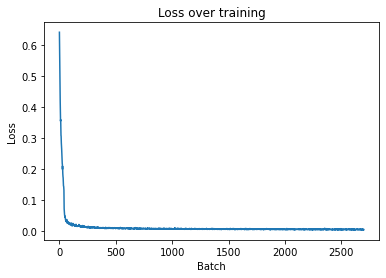

In [71]:
plt.plot(losses)
plt.xlabel("Batch")
plt.ylabel("Loss")
plt.title("Loss over training")
plt.show()

In [72]:
def clean_image(image, ext, sharpness=2, contrast=2, blur=False):
    im = Image.open(f"test/{image}.{ext}").convert('RGB')
    im = ImageEnhance.Sharpness(im).enhance(sharpness)

    fig, ax = plt.subplots(figsize=(15, 15))
    ax.imshow(im, interpolation='nearest')

    to_tensor = transforms.ToTensor()
#     tnsr_im = to_tensor(im).unsqueeze(0).to(device)*255
    tnsr_im = to_tensor(im).unsqueeze(0).to(device)

#     cln_out = model(tnsr_im).detach().clamp(min=0, max=255).cpu().squeeze()/255
    cln_out = model(tnsr_im).detach().cpu().squeeze()

    to_pil = transforms.ToPILImage()

    im_out = to_pil(cln_out)
    im_out = ImageEnhance.Contrast(im_out).enhance(contrast)
    if blur:
        im_out = im_out.filter(ImageFilter.GaussianBlur(radius=0.5)) 
    fig, ax = plt.subplots(figsize=(15, 15))
    ax.imshow(im_out, cmap='gray', interpolation='nearest')

    im.save(f'examples/damaged{image}.png', "PNG")
    im_out.save(f'examples/cleaned{image}.png', "PNG")

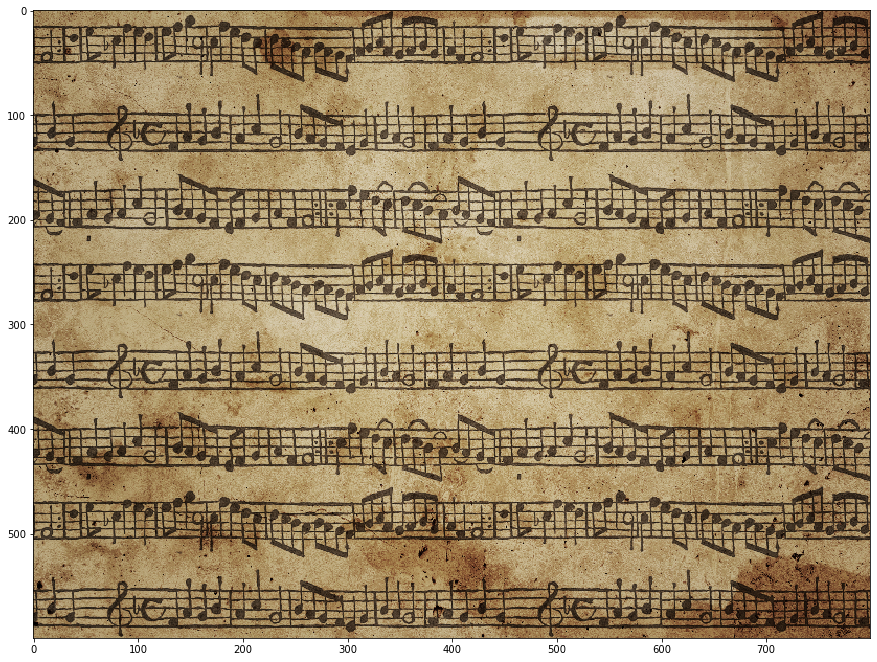

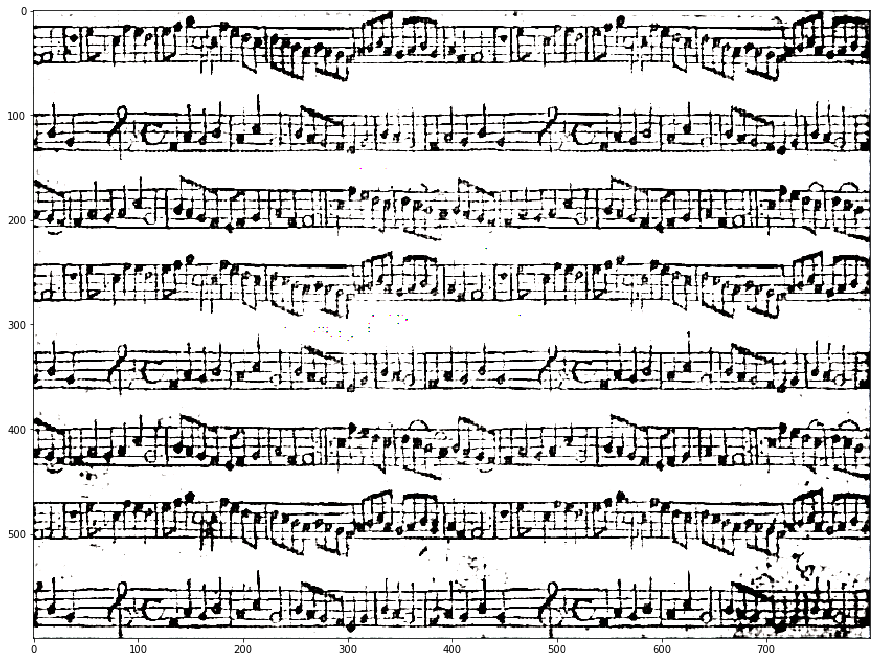

In [94]:
clean_image('1', 'png', 1, 5)

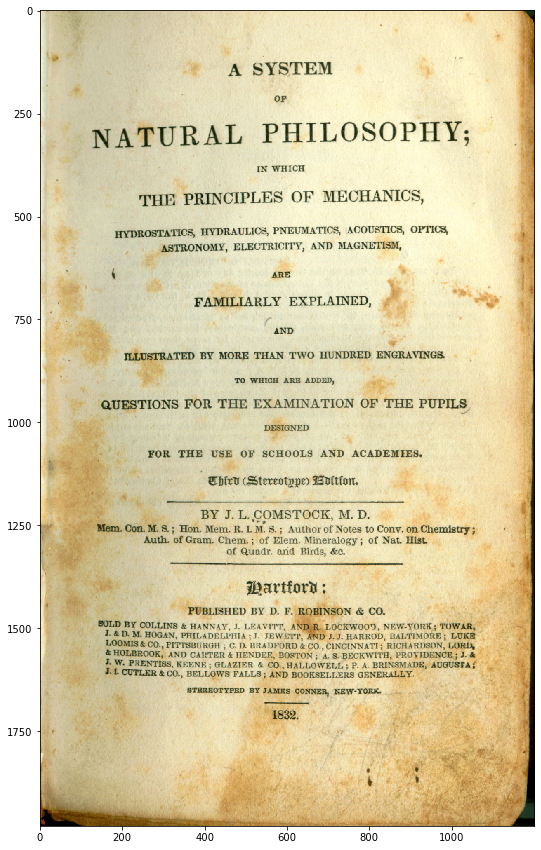

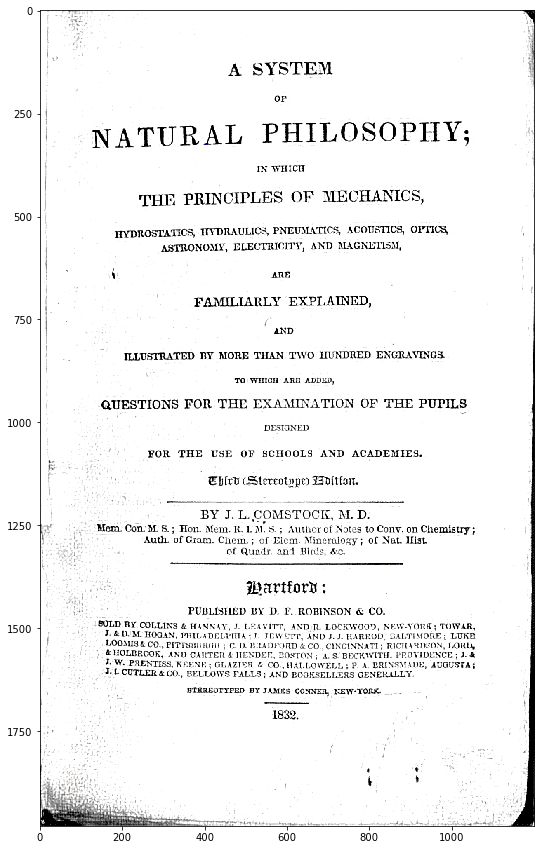

In [86]:
clean_image('2', 'jpg', 1, 1)

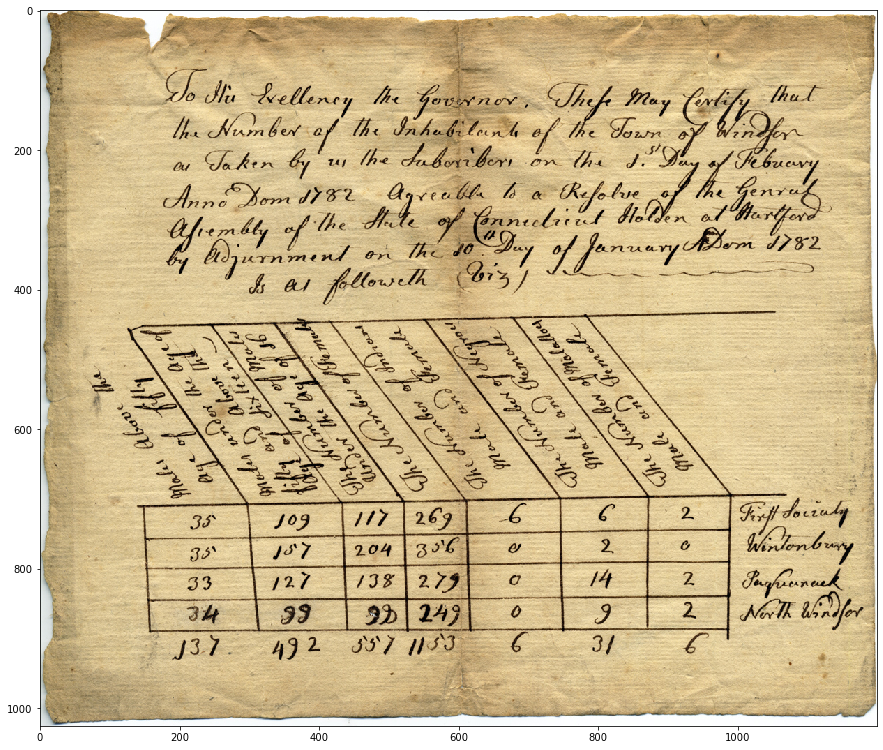

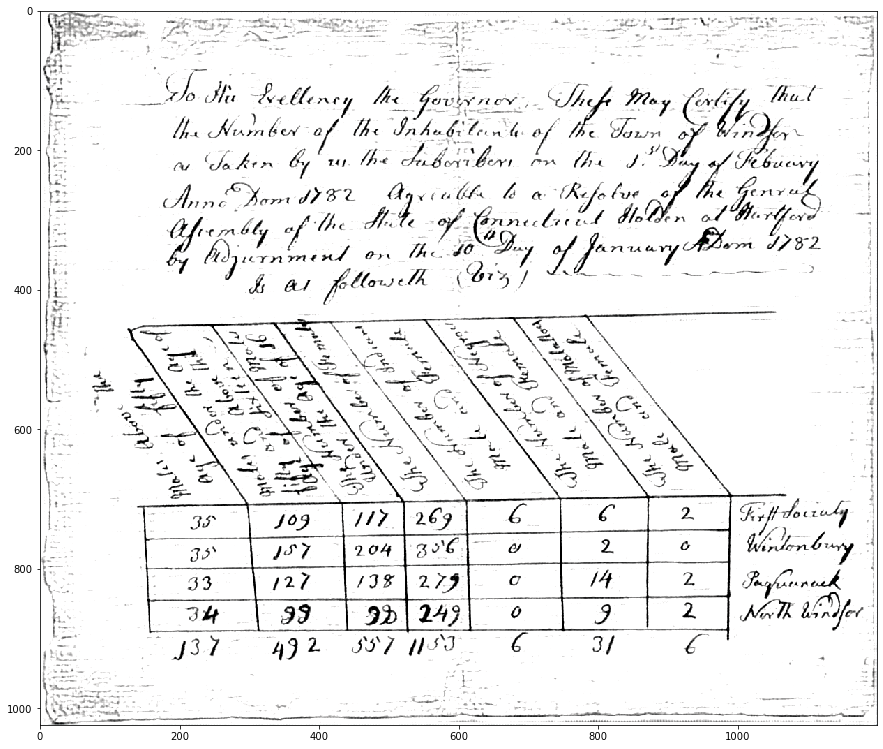

In [76]:
clean_image('3', 'jpg', 1, 1, False)

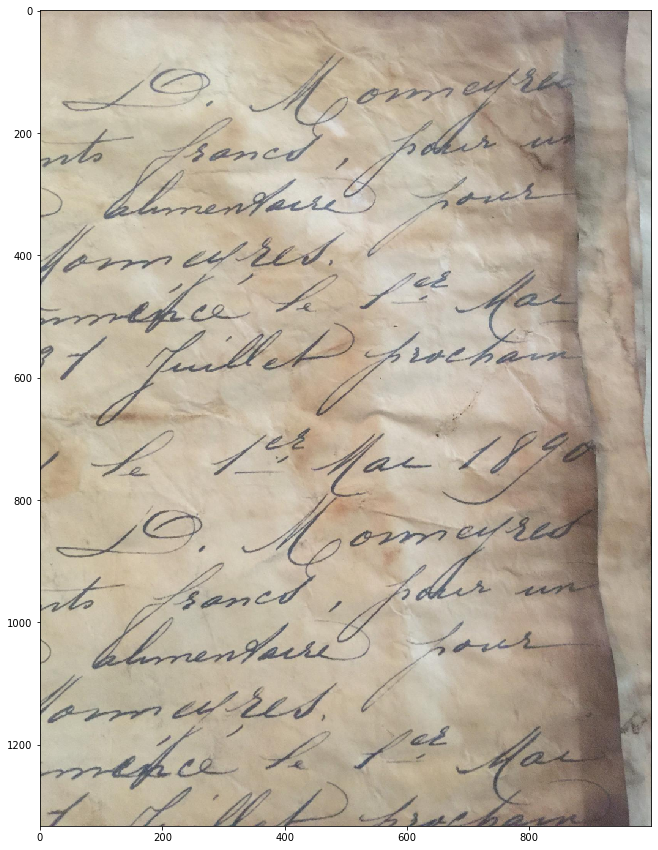

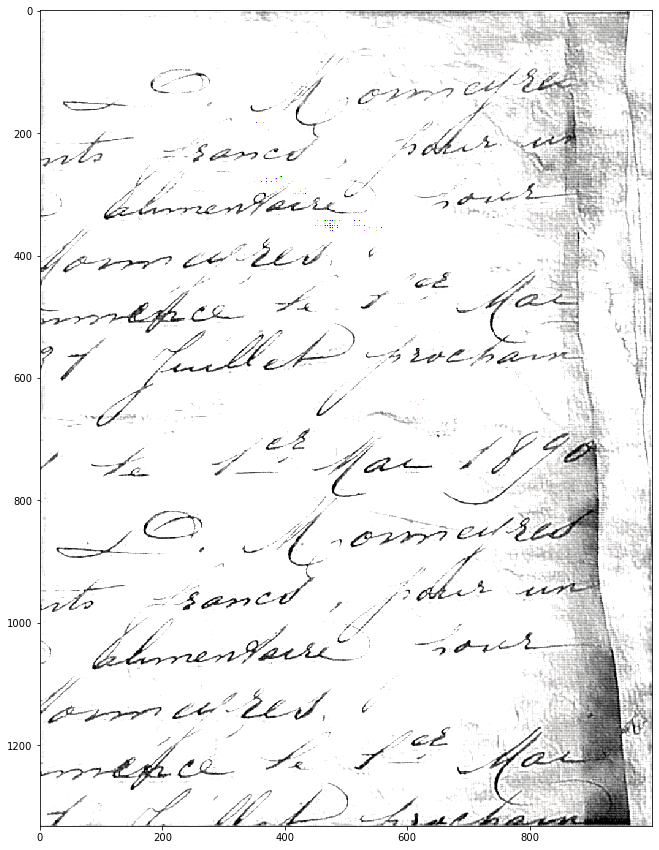

In [83]:
clean_image('4', 'png', 1, 1)

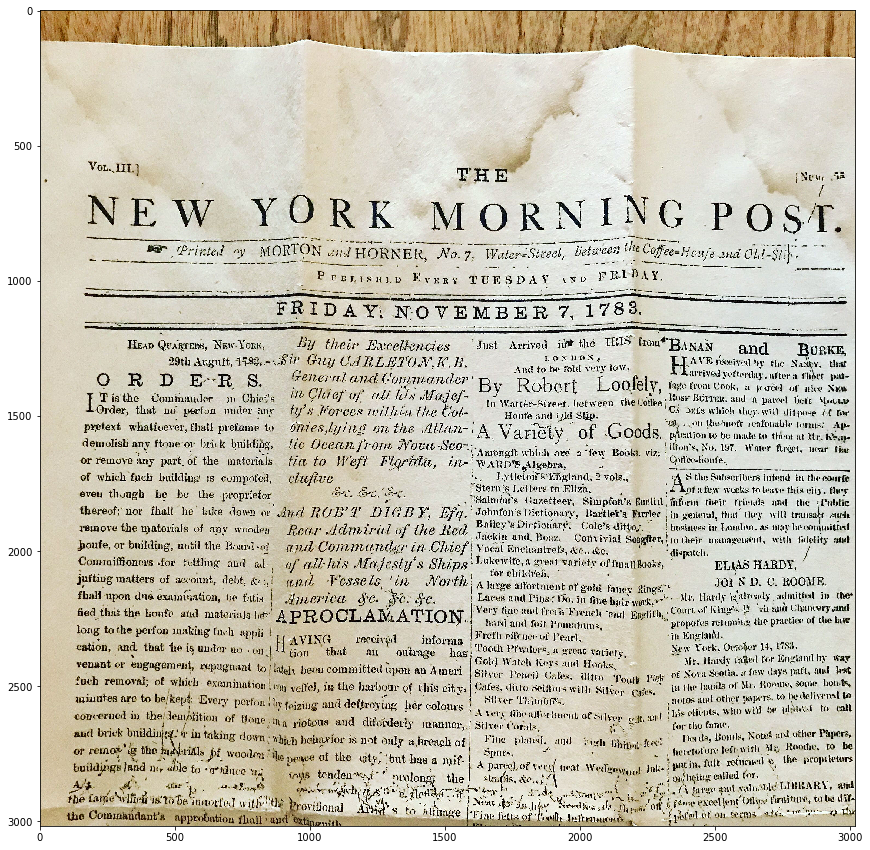

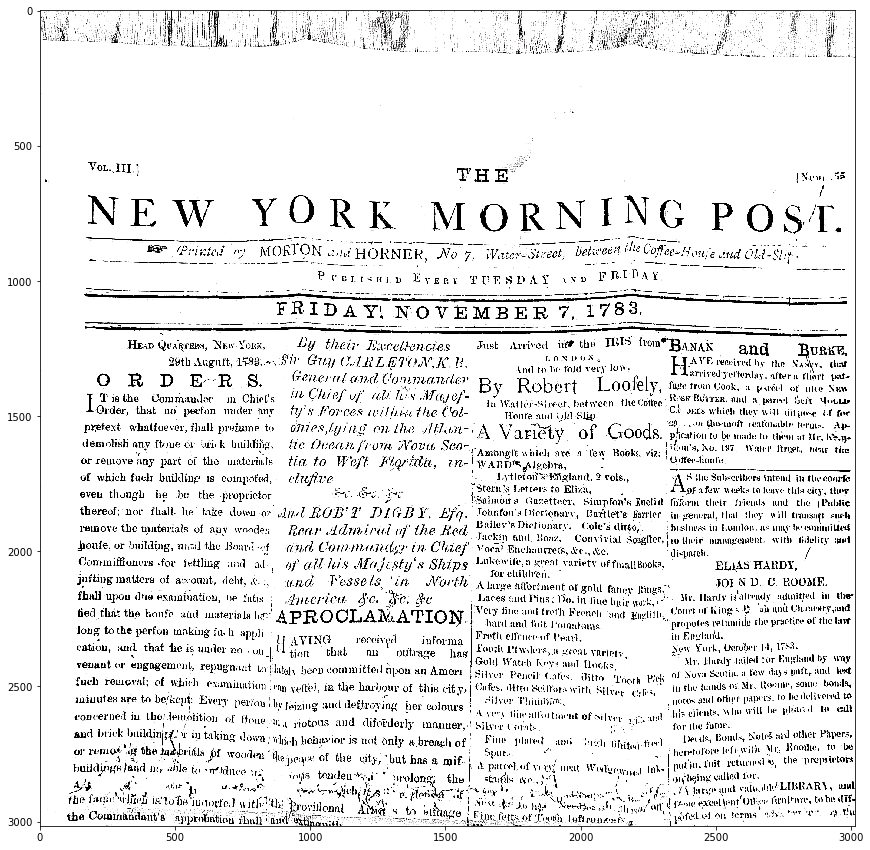

In [84]:
clean_image('5', 'jpg')

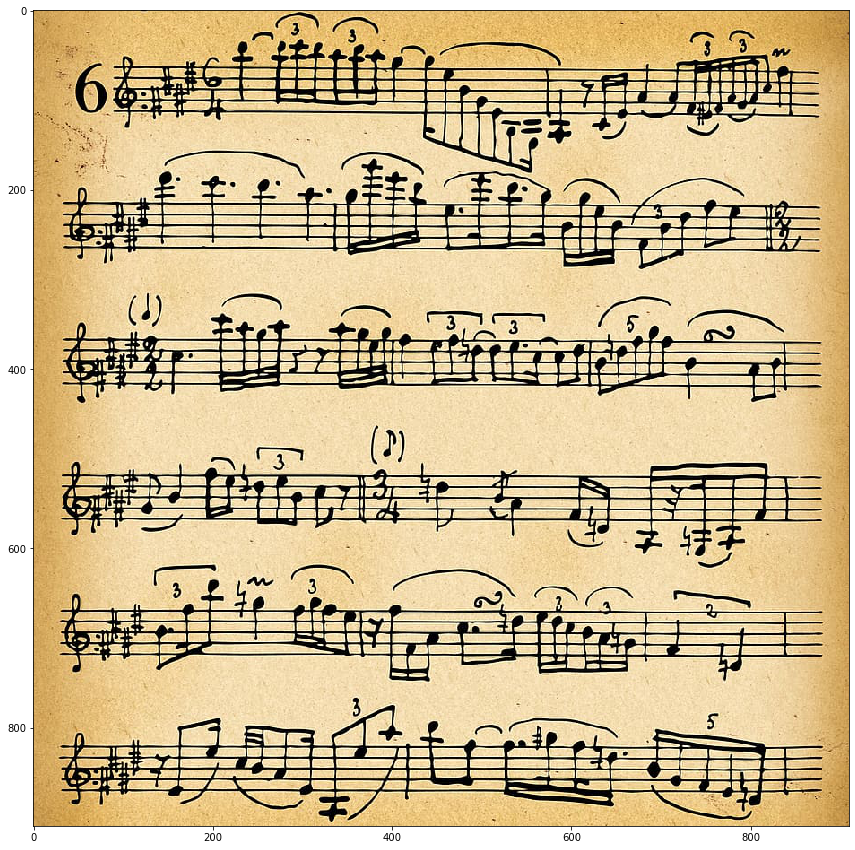

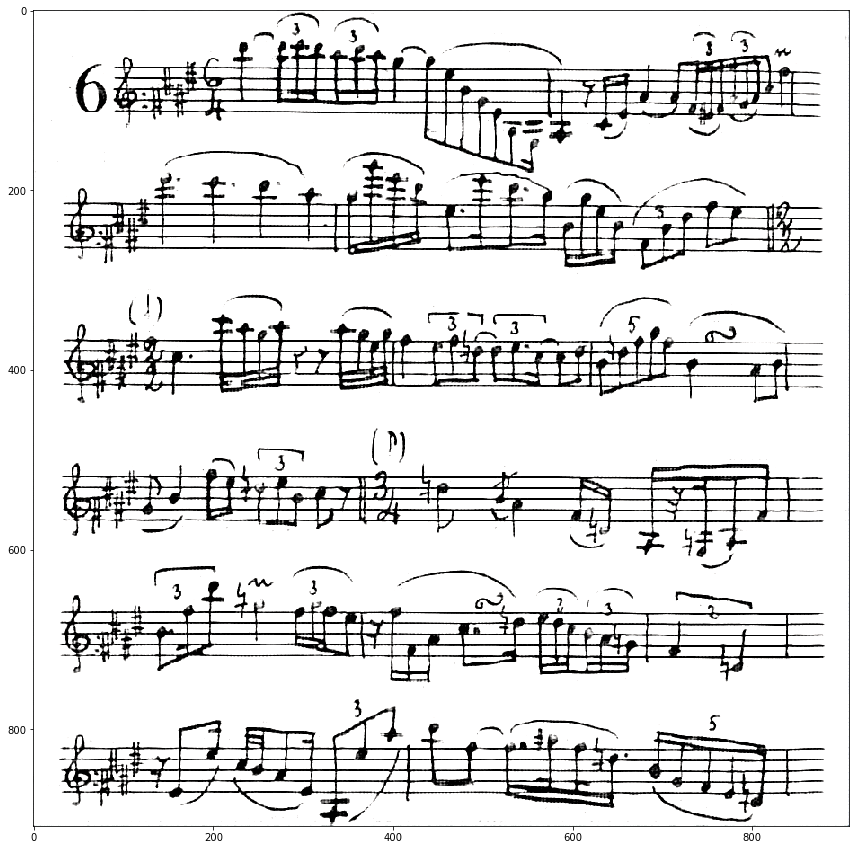

In [96]:
clean_image('6', 'jpg', 1)

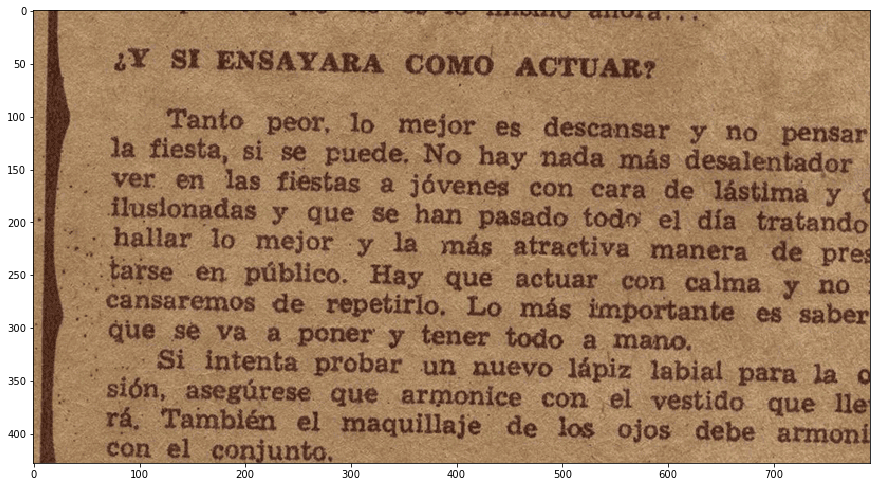

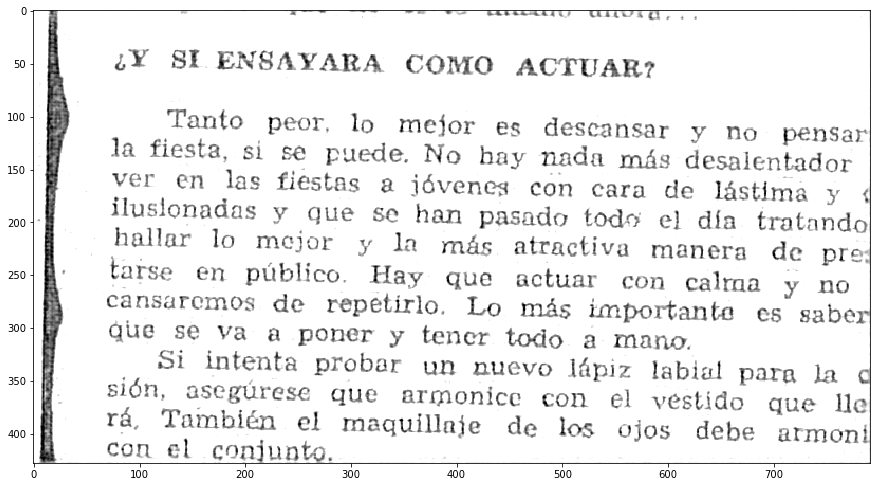

In [81]:
clean_image('7', 'png', 1, 1)